<a href="https://www.kaggle.com/code/abdalrhamnhebishy/comprehensive-sleep-and-health-metrics?scriptVersionId=194805411" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

In [2]:
from IPython.core.display import HTML
# Apply styles globally within the notebook
HTML('''
<style>
  h2 {
    font-size: var(--j3p-content-font-size4);
    background-color:#00FFFF  ;
    color: white;
    display: flex;
    align-items: center;
    justify-content: center;
    padding: 10px 41px;
    top: 10px;
    position: relative;
    border-radius: 10px 50px 10px 50px;
}

 img {       /* flex-grow: 1; */
            /* flex-shrink: 1; */
            border-radius: 100px 70px 150px 70px;
            border: 10px solid #eee;
            display: flex;
            align-items: center;
            justify-content: center;
            transition: box-shadow 0.3s ease; /* Add a transition for a smooth effect */
        }

       img:active {
          box-shadow: 0 10px 20px rgba(255, 255, 0, 0.5), 0 6px 6px rgba(215, 215, 0, 0.5);
        }
</style>
''')        


## Comprehensive Sleep and Health Metrics

<img src="https://storage.googleapis.com/kaggle-datasets-images/5616304/9279309/b800d1cd452038994d1e7de44e361d5d/dataset-cover.jpg?t=2024-08-30-06-48-21" alt="My Image">


## Table of Contents 

<div style="border: 2px solid blue; padding: 10px; background-color: #F5F5F5; color: black; border-radius: 30px 45px 30px 45px;">

   
    
    
<p> &bull;        <a target="_blank"> Introudction</a>  </p> 

<p> &bull;      <a target="_blank"> Explantory Data Analysis</a>  </p>

<p>&bull;       <a target="_blank"> Data Processing</a>  </p>

<p>&bull;       <a target="_blank"> Model Bulding</a> </p>   
    
<p>&bull;       <a target="_blank"> Evalution Metrics </a> </p>   

</div>

## Data Information

<div style="border: 2px solid blue; padding: 10px; background-color: #F5F5F5; color: black; border-radius: 30px 45px 30px 45px;">




<p> &bull; Dataset Introduction .</p> 

<p> &bull;The Comprehensive Sleep and Health Metrics dataset is a fully synthetic collection 
designed to provide an extensive overview of how various factors might influence sleep quality and overall health. This dataset is created to simulate a wide range of scenarios and conditions, offering a robust foundation for predictive modeling and analytical studies. By utilizing synthetic data, the dataset ensures a comprehensive representation of potential variations and interactions in sleep and health metrics. </p>

</div>

## Dataset Features

| Variable      | Description                                                                                                 |
| ------------- | ----------------------------------------------------------------------------------------------------------- |
| Heart Rate Variability :            |  Simulated variability in time intervals between heartbeats.                                                                                      |
| Body Temperature :         | Artificially generated body temperature in degrees Celsius.                                                                                      |
| Movement During Sleep :    | TSynthetic data on the amount of movement while sleeping                                                                                |
| Sleep Duration Hours   :        | Total hours of sleep generated through simulation.                                                                                        |
| Sleep Quality Score     :          | A synthetic score representing the quality of sleep.                                                                                |
| Caffeine Intake (mg)     :   | Amount of simulated caffeine consumption in milligrams.                                                                               |
| tress Level:               | An index of simulated stress levels.                                                                                |
| Bedtime Consistency   :         | Simulated consistency of bedtime routine.                                                                           |
| Light Exposure Hours   :        | Synthetic hours of light exposure during the day.    

## Understand the Task :

<div style="border: 2px solid blue; padding: 10px; background-color: #F5F5F5; color: black; border-radius: 30px 45px 30px 45px;">

<p> &bull; Prediction Task .</p> 

<p> &bull;The goal is to predict the Sleep Quality Score based on the other synthetic health and sleep metrics.</p> 

<p>This predictive analysis aims to uncover patterns and relationships within the simulated data, providing insights into factors that could impact sleep quality and guiding the development of strategies for improving sleep health. </p>

<p> &bull; This problem Consider as Regression   .</p> 

<p> &bull; Target of this problem to predict Sleep Quality Score  </p>

<p> &bull; I will Train 5 models for Machine learning with visualization of them.  .</p> 

<p>&bull; Also i will Make Explanory Analysis for the Data By using   Pandas  </p>

<p>&bull; Also i will learn the Relations between the Feature to  Make Different Plots that Represent the Data  </p>   
    

</div>

## Import Libararies 

In [2]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder,StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.base import BaseEstimator , TransformerMixin
from sklearn.feature_selection import VarianceThreshold ,f_classif ,SelectKBest
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn import metrics
from sklearn.metrics import classification_report,confusion_matrix ,ConfusionMatrixDisplay,accuracy_score,precision_score,recall_score,f1_score
from sklearn.metrics import mean_squared_error
from sklearn import tree
from sklearn.svm import SVR
from sklearn.linear_model import LinearRegression
from sklearn.impute import SimpleImputer
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV
import sqlite3
from plotly.graph_objs import *
import plotly.express as px 

In [3]:
# load the data:

data=pd.read_csv("wearable_tech_sleep_quality_extended.csv")
data.head(25)

,Heart_Rate_Variability,Body_Temperature,Movement_During_Sleep,Sleep_Duration_Hours,Sleep_Quality_Score,Caffeine_Intake_mg,Stress_Level,Bedtime_Consistency,Light_Exposure_hours
0,76.22,36.46,1.31,8.04,5.72,157.45,6.83,0.04,11.52
1,116.55,37.35,1.23,8.78,8.05,189.37,2.55,0.19,11.00
2,101.24,38.18,4.53,5.50,7.60,341.82,8.85,0.83,1.53
3,91.91,37.83,1.25,7.75,1.54,136.00,6.52,0.77,14.76
4,60.92,38.02,1.36,7.43,1.49,347.86,2.41,0.35,9.10
5,60.92,37.65,3.80,9.00,2.68,35.25,9.66,0.38,5.82
6,54.07,37.73,2.25,9.44,3.61,310.72,5.67,0.53,12.10
7,110.63,38.12,3.88,4.07,4.08,339.02,1.66,0.00,4.12
8,92.08,36.62,0.33,8.04,6.80,72.73,6.64,0.24,11.10
9,99.57,37.22,2.44,4.31,0.57,172.14,3.28,0.21,0.64


## Explore the Data 

In [4]:
#get info about the dataset:
print(data.info())
print("-"*25)
# to know more about the shape of the dataset:
print("shape of the dataset -->>",np.shape(data))



<class 'pandas.core.frame.DataFrame'>

RangeIndex: 1000 entries, 0 to 999

Data columns (total 9 columns):

 #   Column                  Non-Null Count  Dtype  

---  ------                  --------------  -----  

 0   Heart_Rate_Variability  1000 non-null   float64

 1   Body_Temperature        1000 non-null   float64

 2   Movement_During_Sleep   1000 non-null   float64

 3   Sleep_Duration_Hours    1000 non-null   float64

 4   Sleep_Quality_Score     1000 non-null   float64

 5   Caffeine_Intake_mg      1000 non-null   float64

 6   Stress_Level            1000 non-null   float64

 7   Bedtime_Consistency     1000 non-null   float64

 8   Light_Exposure_hours    1000 non-null   float64

dtypes: float64(9)

memory usage: 70.4 KB

None

-------------------------

shape of the dataset -->> (1000, 9)


In [5]:
#get the statistical:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
Heart_Rate_Variability,1000.0,84.31788,20.449611,50.32,66.5200,84.780,102.1050,119.98
Body_Temperature,1000.0,37.26745,0.730578,36.01,36.6000,37.300,37.9000,38.50
Movement_During_Sleep,1000.0,2.51201,1.453322,0.00,1.3075,2.500,3.8000,4.99
Sleep_Duration_Hours,1000.0,6.94229,1.719060,4.00,5.4500,6.905,8.4225,10.00
Sleep_Quality_Score,1000.0,4.94096,2.868117,0.00,2.4500,4.945,7.3975,9.98
Caffeine_Intake_mg,1000.0,199.38579,115.677925,2.47,99.7525,196.160,295.9400,399.74
Stress_Level,1000.0,5.43979,2.607605,1.01,3.1600,5.365,7.8100,10.00
Bedtime_Consistency,1000.0,0.48214,0.284947,0.00,0.2375,0.480,0.7100,1.00
Light_Exposure_hours,1000.0,7.78397,4.515700,0.00,3.9925,7.660,11.4550,15.94


In [6]:
# get Types of data:

data.dtypes

Heart_Rate_Variability    float64
Body_Temperature          float64
Movement_During_Sleep     float64
Sleep_Duration_Hours      float64
Sleep_Quality_Score       float64
Caffeine_Intake_mg        float64
Stress_Level              float64
Bedtime_Consistency       float64
Light_Exposure_hours      float64
dtype: object

In [7]:
# know the number of every item in every column:

for col in data.columns:
    print(f"counts of items in {col} -->> \n {data[col].value_counts()}")
    print("-"*25)

counts of items in Heart_Rate_Variability -->> 

 Heart_Rate_Variability

62.73    3

53.17    3

87.99    3

86.32    3

84.48    3

        ..

62.12    1

80.37    1

77.90    1

93.11    1

81.22    1

Name: count, Length: 930, dtype: int64

-------------------------

counts of items in Body_Temperature -->> 

 Body_Temperature

38.18    12

37.74    10

38.17     9

36.33     9

38.04     8

         ..

38.28     1

36.35     1

38.27     1

38.14     1

36.91     1

Name: count, Length: 244, dtype: int64

-------------------------

counts of items in Movement_During_Sleep -->> 

 Movement_During_Sleep

4.82    6

2.56    6

0.36    6

4.11    6

3.57    6

       ..

4.94    1

2.27    1

0.80    1

0.58    1

4.00    1

Name: count, Length: 438, dtype: int64

-------------------------

counts of items in Sleep_Duration_Hours -->> 

 Sleep_Duration_Hours

4.40    7

8.04    6

5.63    6

8.83    6

6.13    6

       ..

8.84    1

7.52    1

7.49    1

5.37    1

7.18    1

Name

In [8]:
# to know the uniques values in evey column in the dataset:
for col in data.columns:
    print(f"All items in the ---->>>{col} column  :  \n{data[col].unique()}")
    print("*"*50)

All items in the ---->>>Heart_Rate_Variability column  :  

[ 76.22 116.55 101.24  91.91  60.92  54.07 110.63  92.08  99.57  51.44

 117.89 108.27  64.86  62.73  62.84  71.3   86.73  80.24  70.39  92.83

  59.76  70.45  75.65  81.92 104.96  63.98  86.    91.47  53.25  92.53

  61.94  54.55 116.42 117.59 106.59  71.32  56.84  97.9   80.81  58.54

  84.66  52.41 113.65  68.11  96.38  71.82  86.4   88.27  62.94 117.87

 104.26 115.76 112.64  91.85 114.53  56.19  63.72  53.17  72.77  77.21

  68.99 108.01  74.97  69.67  87.99  59.86 106.15  55.22 119.08 104.06

  63.91  50.39 107.08  99.48 101.03 103.99  55.18  75.09  58.11 110.42

  93.63  73.16  54.45  71.77  72.76 101.07  94.63 112.1   83.06  58.37

  99.93 103.25  89.29 103.97  84.57  86.59  79.93  51.78  57.55  52.2

  94.55  72.    85.6  113.53  67.45  78.73 102.89  66.02  55.39  70.28

  61.29 115.08 106.57  94.34 111.   106.26  63.06 112.48  87.75 106.52

 112.73  72.26  57.7   65.96  79.9  107.26 110.25  50.49  85.75  79.22

  65.

In [9]:
# Extract all Types of columns from the data :
for col in data.columns:
    obj_cols=data.select_dtypes("object").columns

    num_cols=data.select_dtypes("number").columns

    disc_cols=data.select_dtypes(include=("int64")).columns

    conts_cols=data.select_dtypes(include=("float64")).columns

    Nomial_cols=data.nunique()[data.nunique()<3]

print(f"object_columns ----->>> {obj_cols}\n Numerical_columns ----->>> {num_cols} \n Discrete_columns ---->>> {disc_cols} \n Continous_cols ----->> {conts_cols} \n Nominal Columns --->> {Nomial_cols}")

object_columns ----->>> Index([], dtype='object')

 Numerical_columns ----->>> Index(['Heart_Rate_Variability', 'Body_Temperature', 'Movement_During_Sleep',

       'Sleep_Duration_Hours', 'Sleep_Quality_Score', 'Caffeine_Intake_mg',

       'Stress_Level', 'Bedtime_Consistency', 'Light_Exposure_hours'],

      dtype='object') 

 Discrete_columns ---->>> Index([], dtype='object') 

 Continous_cols ----->> Index(['Heart_Rate_Variability', 'Body_Temperature', 'Movement_During_Sleep',

       'Sleep_Duration_Hours', 'Sleep_Quality_Score', 'Caffeine_Intake_mg',

       'Stress_Level', 'Bedtime_Consistency', 'Light_Exposure_hours'],

      dtype='object') 

 Nominal Columns --->> Series([], dtype: int64)


In [10]:
# VaraianceThreshold:
selector=VarianceThreshold(threshold=0.01)
selector.fit(data.select_dtypes("number"))

VarianceThreshold(threshold=0.01)

In [11]:
class Var_Selector(BaseEstimator,TransformerMixin):
    
    def __init__(self,num_cols):
        self.num_cols=None
    def fit(self,data):
        self.num_cols=data.select_dtypes("number").columns
        return self
    def transform(self,data):
        selector=VarianceThreshold(threshold=0.01)
        selector.fit(data[self.num_cols])
        
        removed_cols=[column for column in self.num_cols if column not in \
                     self.num_cols[selector.get_support(indices=True)]]
        data=data.drop(columns=removed_cols)
        
        # remove high-low cardinality categorical:-
        
        removed_cols=data.nunique()[((data.nunique()==1)|data.nunique()==len(data))].index
        
        return data.drop(columns=removed_cols)
        

In [12]:
transform=Var_Selector(data)
transform.fit(data)
transform.transform(data)

,Heart_Rate_Variability,Body_Temperature,Movement_During_Sleep,Sleep_Duration_Hours,Sleep_Quality_Score,Caffeine_Intake_mg,Stress_Level,Bedtime_Consistency,Light_Exposure_hours
0,76.22,36.46,1.31,8.04,5.72,157.45,6.83,0.04,11.52
1,116.55,37.35,1.23,8.78,8.05,189.37,2.55,0.19,11.00
2,101.24,38.18,4.53,5.50,7.60,341.82,8.85,0.83,1.53
3,91.91,37.83,1.25,7.75,1.54,136.00,6.52,0.77,14.76
4,60.92,38.02,1.36,7.43,1.49,347.86,2.41,0.35,9.10
...,...,...,...,...,...,...,...,...,...
995,56.41,37.64,4.33,6.65,8.97,273.77,6.22,0.27,8.24
996,114.21,38.39,0.79,6.01,1.19,201.29,7.00,0.21,2.65
997,59.58,36.17,1.55,6.37,3.28,306.06,9.20,0.46,15.64
998,116.52,36.14,1.45,7.18,8.16,194.12,4.11,0.91,1.73


In [13]:
# Calculate the correlation & plot the heatmap-correlation Matrix:

corr=data.select_dtypes("number").corr()
corr

,Heart_Rate_Variability,Body_Temperature,Movement_During_Sleep,Sleep_Duration_Hours,Sleep_Quality_Score,Caffeine_Intake_mg,Stress_Level,Bedtime_Consistency,Light_Exposure_hours
Heart_Rate_Variability,1.000000,0.029186,0.014570,-0.029414,0.034751,-0.059446,0.027250,-0.025111,-0.040856
Body_Temperature,0.029186,1.000000,0.027347,-0.005760,0.032978,0.030023,0.042423,0.049621,0.003121
Movement_During_Sleep,0.014570,0.027347,1.000000,-0.013619,-0.008928,-0.020208,-0.028203,-0.047277,-0.005330
Sleep_Duration_Hours,-0.029414,-0.005760,-0.013619,1.000000,-0.044683,0.039821,-0.017170,-0.023038,0.025400
Sleep_Quality_Score,0.034751,0.032978,-0.008928,-0.044683,1.000000,-0.055882,0.020586,-0.009052,0.028318
Caffeine_Intake_mg,-0.059446,0.030023,-0.020208,0.039821,-0.055882,1.000000,0.007979,0.012094,-0.031930
Stress_Level,0.027250,0.042423,-0.028203,-0.017170,0.020586,0.007979,1.000000,0.038214,0.001184
Bedtime_Consistency,-0.025111,0.049621,-0.047277,-0.023038,-0.009052,0.012094,0.038214,1.000000,-0.049813
Light_Exposure_hours,-0.040856,0.003121,-0.005330,0.025400,0.028318,-0.031930,0.001184,-0.049813,1.000000


(0.0, 419.6035)

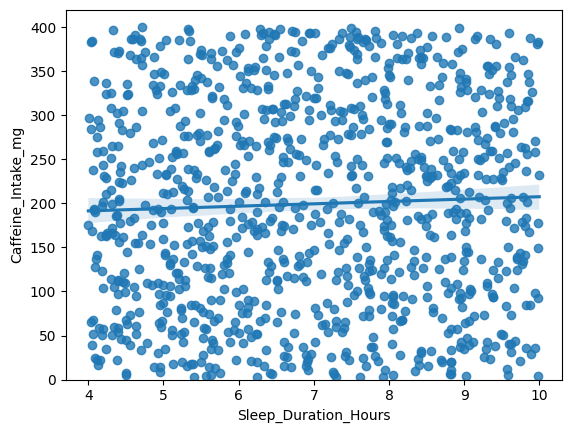

In [14]:
# positve correlation Relationship :
sns.regplot(x=data["Sleep_Duration_Hours"],y=data["Caffeine_Intake_mg"])
plt.ylim(0,)

(0.0, 419.6035)

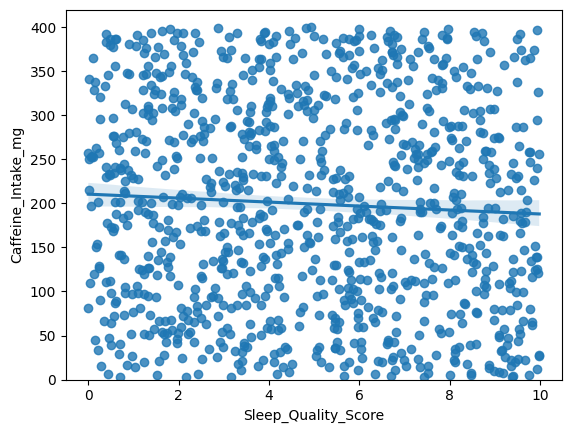

In [15]:
# Negative Rellationship :
sns.regplot(x=data["Sleep_Quality_Score"],y=data["Caffeine_Intake_mg"])
plt.ylim(0,)

(0.0, 1.05)

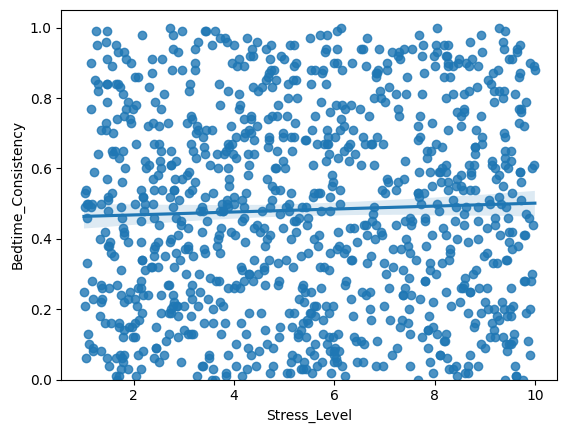

In [16]:
# positve Rellationship :
sns.regplot(x=data["Stress_Level"],y=data["Bedtime_Consistency"])
plt.ylim(0,)


Text(0.5, 1.0, 'Correlation_HEatmap_MAtrix')

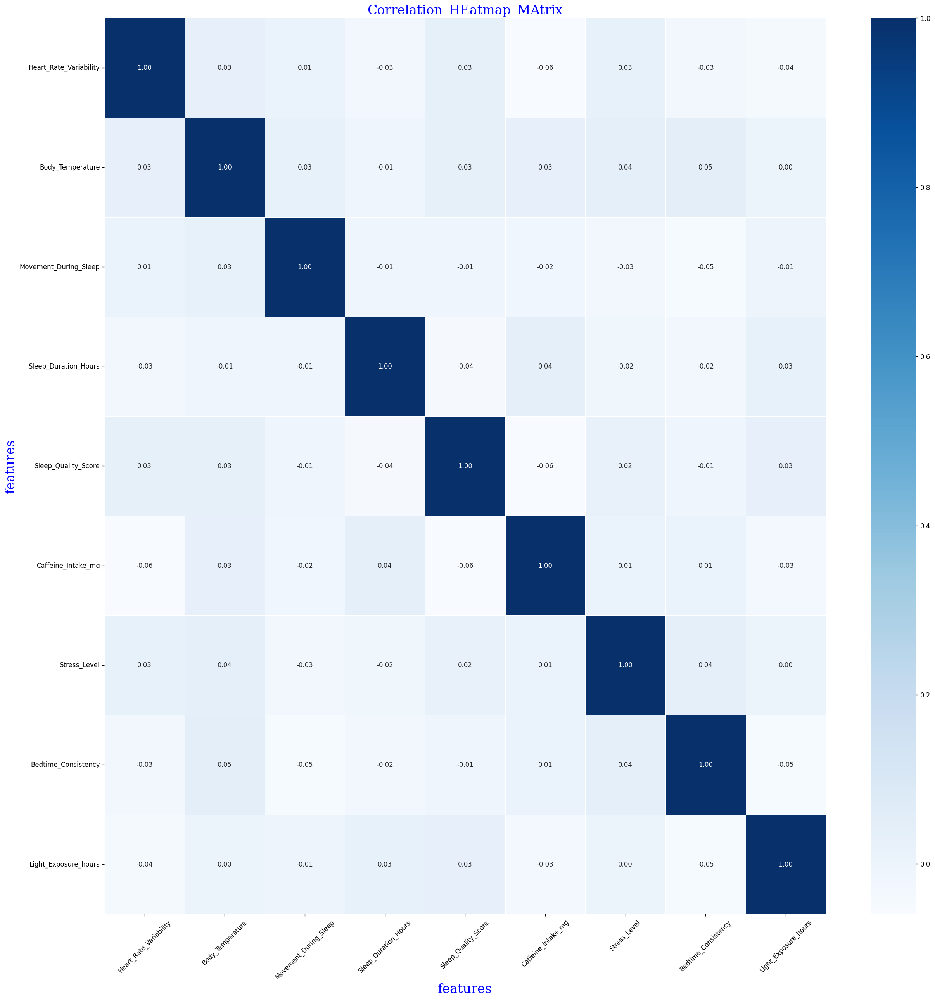

In [17]:
# 5-plot the heatmap_Correlation_MatRix:
f1={"family":"serif","size":20,"color":"b"}
plt.figure(figsize=(25,25),dpi=120)
sns.heatmap(data.select_dtypes("number").corr(),annot=True,fmt="0.2f",cmap='Blues',linewidths=0.5)
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.xlabel("features",fontdict=f1)
plt.ylabel("features",fontdict=f1)
plt.title("Correlation_HEatmap_MAtrix",fontdict=f1)


## Defination outliers & See Normal Distribution on the some Data features

In [18]:
# Not Found Any outliers :
features=data.select_dtypes("number").columns
for col in features:
    Q1_col,Q3_col=data[col].quantile([0.25,0.75])
    iqr=Q3_col-Q1_col
    low_limit=Q1_col-1.5*iqr 
    upper_limit=Q3_col+1.5*iqr
    outlier=[]
    for x in data[col]: 
         if ((x> upper_limit) or (x<low_limit)): 
             outlier.append(x)           
    if len(outlier)==0:
        print(f" * -- >> there No outlier in {col} feature")
    else:
        print(f"Ther outlier in this feature {col}")
       
    print(f"Q1 of {col} --->>> {Q1_col} \n Q3 of {col} ---->>> {Q3_col} \n iqr--->>{iqr}\n low_limit--->>>{low_limit} \n  upper_limit--->>> {upper_limit} \n outlier---->>> {outlier} \n Number of outliers --->>> {len(outlier)}")
    print("-"*25)

 * -- >> there No outlier in Heart_Rate_Variability feature

Q1 of Heart_Rate_Variability --->>> 66.52 

 Q3 of Heart_Rate_Variability ---->>> 102.105 

 iqr--->>35.58500000000001

 low_limit--->>>13.142499999999984 

  upper_limit--->>> 155.48250000000002 

 outlier---->>> [] 

 Number of outliers --->>> 0

-------------------------

 * -- >> there No outlier in Body_Temperature feature

Q1 of Body_Temperature --->>> 36.6 

 Q3 of Body_Temperature ---->>> 37.9 

 iqr--->>1.2999999999999972

 low_limit--->>>34.650000000000006 

  upper_limit--->>> 39.849999999999994 

 outlier---->>> [] 

 Number of outliers --->>> 0

-------------------------

 * -- >> there No outlier in Movement_During_Sleep feature

Q1 of Movement_During_Sleep --->>> 1.3075 

 Q3 of Movement_During_Sleep ---->>> 3.8 

 iqr--->>2.4924999999999997

 low_limit--->>>-2.4312499999999995 

  upper_limit--->>> 7.538749999999999 

 outlier---->>> [] 

 Number of outliers --->>> 0

-------------------------

 * -- >> there 

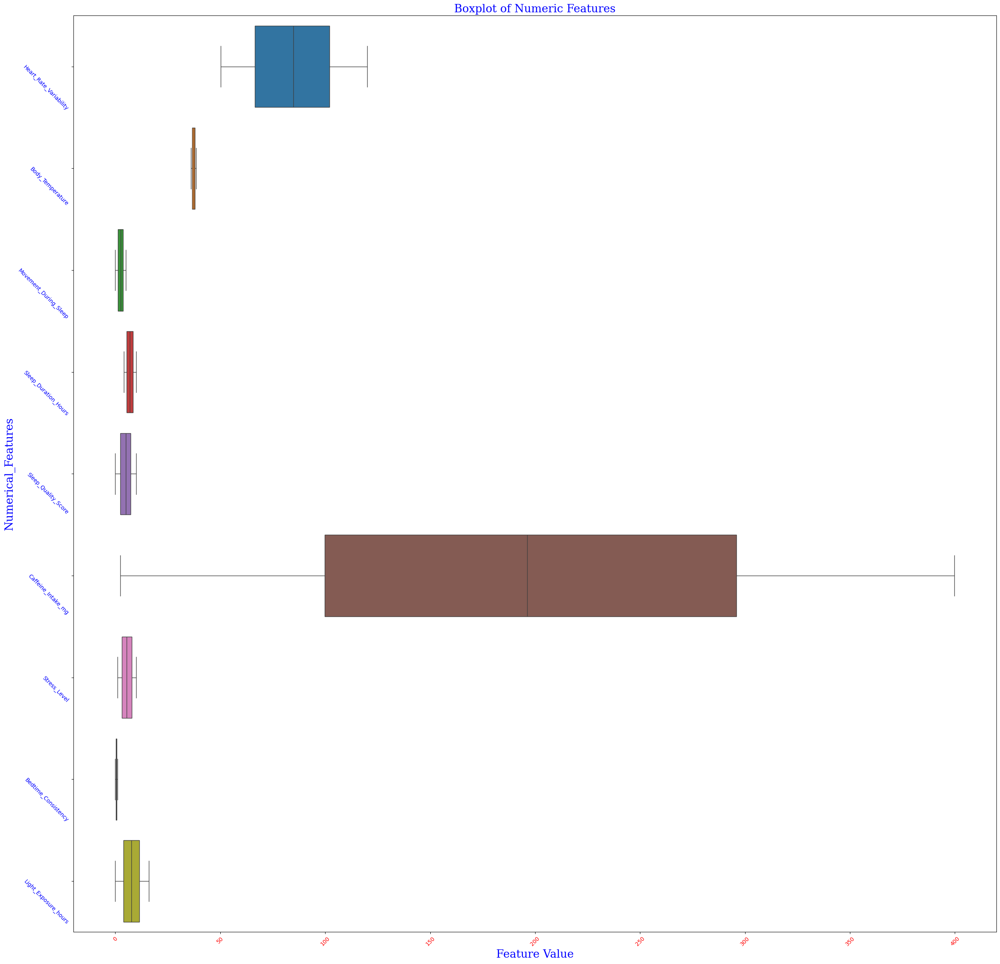

In [19]:
# Check if there Any outliers : Not Found Any outliers
plt.figure(figsize=(30, 30))
sns.boxplot(data=data.select_dtypes("number"), orient='h')
plt.title('Boxplot of Numeric Features',fontdict=f1)
plt.xlabel('Feature Value',fontdict=f1)
plt.xticks(rotation=45,color="r")
plt.yticks(rotation=-45,color="b")
plt.ylabel("Numerical_Features",fontdict=f1)
plt.show()

upper_limit :  1.3369800640676215

lower_limit :  -0.3727000640676214

Mean Value :  0.48214000000000007

Median Value :  0.48

1st Standard Deviation :  0.2849466880225405


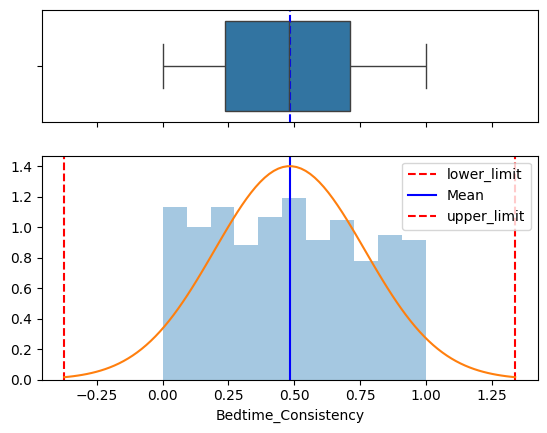

In [20]:
#see outlier on Bedtime_Consistency feaure & see Normal Dis : 
# we found the this feature follow Standard Normal Distribution and this is good 

from scipy.stats import norm
import warnings
warnings.filterwarnings('ignore')

f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw= {"height_ratios": (0.5, 1)})

mean=data.Bedtime_Consistency.mean()
std = data.Bedtime_Consistency.std()
median = data.Bedtime_Consistency.median()
upper_limit = mean + std*3
lower_limit = mean - std*3
print("upper_limit : ", upper_limit)
print("lower_limit : ",lower_limit)

sns.boxplot(x=data["Bedtime_Consistency"], ax=ax_box)
ax_box.axvline(mean, color='b', linestyle='--')


sns.distplot(data["Bedtime_Consistency"], ax=ax_hist,kde=False,norm_hist=True)
ax_hist.axvline(lower_limit, color='r', linestyle='--')
ax_hist.axvline(mean, color='b', linestyle='-')
ax_hist.axvline(upper_limit, color='r', linestyle='--')



plt.legend({'Mean':mean})

ax_box.set(xlabel='')

x = np.linspace(mean - 3*std, mean + 3*std, 100)
plt.plot(x, norm.pdf(x, mean, std))
plt.legend({"lower_limit":lower_limit,'Mean':mean,'upper_limit':upper_limit})
print("Mean Value : ",mean)
print("Median Value : ",median)
print("1st Standard Deviation : ",std)

plt.show()

## Cleaning :
















In [21]:
#check if there null values in data:
# Not Found Any Null Values  

data.isna().mean()

Heart_Rate_Variability    0.0
Body_Temperature          0.0
Movement_During_Sleep     0.0
Sleep_Duration_Hours      0.0
Sleep_Quality_Score       0.0
Caffeine_Intake_mg        0.0
Stress_Level              0.0
Bedtime_Consistency       0.0
Light_Exposure_hours      0.0
dtype: float64

In [22]:
# check the Duplicated values / rows => Not found 
data.duplicated().sum()

0

## Visualization 

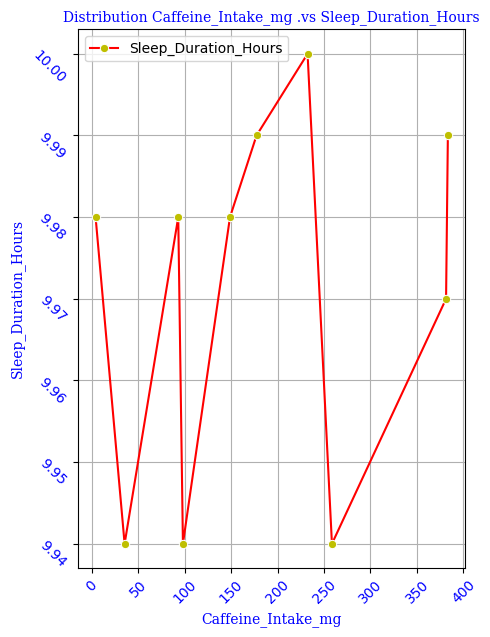

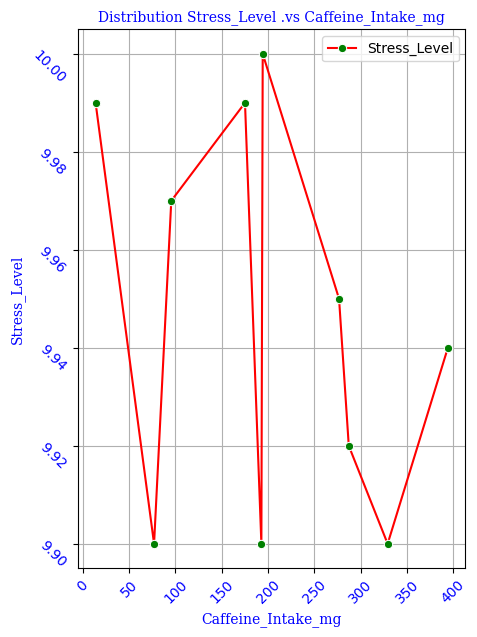

In [23]:
# Distribution Caffeine_Intake_mg .vs Sleep_Duration_Hours

f2={"family":"serif","size":10,"color":"b"}
plt.figure(figsize=(5,7))
plt.title("Distribution Caffeine_Intake_mg .vs Sleep_Duration_Hours",fontdict=f2)

top1=data.groupby("Caffeine_Intake_mg")["Sleep_Duration_Hours"].mean().sort_values(ascending=False).head(10)
sns.lineplot(x=top1.index,y=top1.values,color="r",marker="o",mfc="y",label="Sleep_Duration_Hours")

plt.xticks(rotation=45,color="b")
plt.xlabel("Caffeine_Intake_mg",fontdict=f2)
plt.ylabel("Sleep_Duration_Hours",fontdict=f2)
plt.yticks(rotation=-45,color="b")
plt.grid(True)
plt.show()


# Distribution Stress_Level .vs Caffeine_Intake_mg :


plt.figure(figsize=(5,7))
plt.title("Distribution Stress_Level .vs Caffeine_Intake_mg",fontdict=f2)

top1=data.groupby("Caffeine_Intake_mg")["Stress_Level"].mean().sort_values(ascending=False).head(10)
sns.lineplot(x=top1.index,y=top1.values,color="r",marker="o",mfc="g",label="Stress_Level")

plt.xticks(rotation=45,color="b")
plt.xlabel("Caffeine_Intake_mg",fontdict=f2)
plt.ylabel("Stress_Level",fontdict=f2)
plt.yticks(rotation=-45,color="b")
plt.grid(True)
plt.show()


array([[<Axes: title={'center': 'Heart_Rate_Variability'}>,
        <Axes: title={'center': 'Body_Temperature'}>,
        <Axes: title={'center': 'Movement_During_Sleep'}>],
       [<Axes: title={'center': 'Sleep_Duration_Hours'}>,
        <Axes: title={'center': 'Sleep_Quality_Score'}>,
        <Axes: title={'center': 'Caffeine_Intake_mg'}>],
       [<Axes: title={'center': 'Stress_Level'}>,
        <Axes: title={'center': 'Bedtime_Consistency'}>,
        <Axes: title={'center': 'Light_Exposure_hours'}>]], dtype=object)

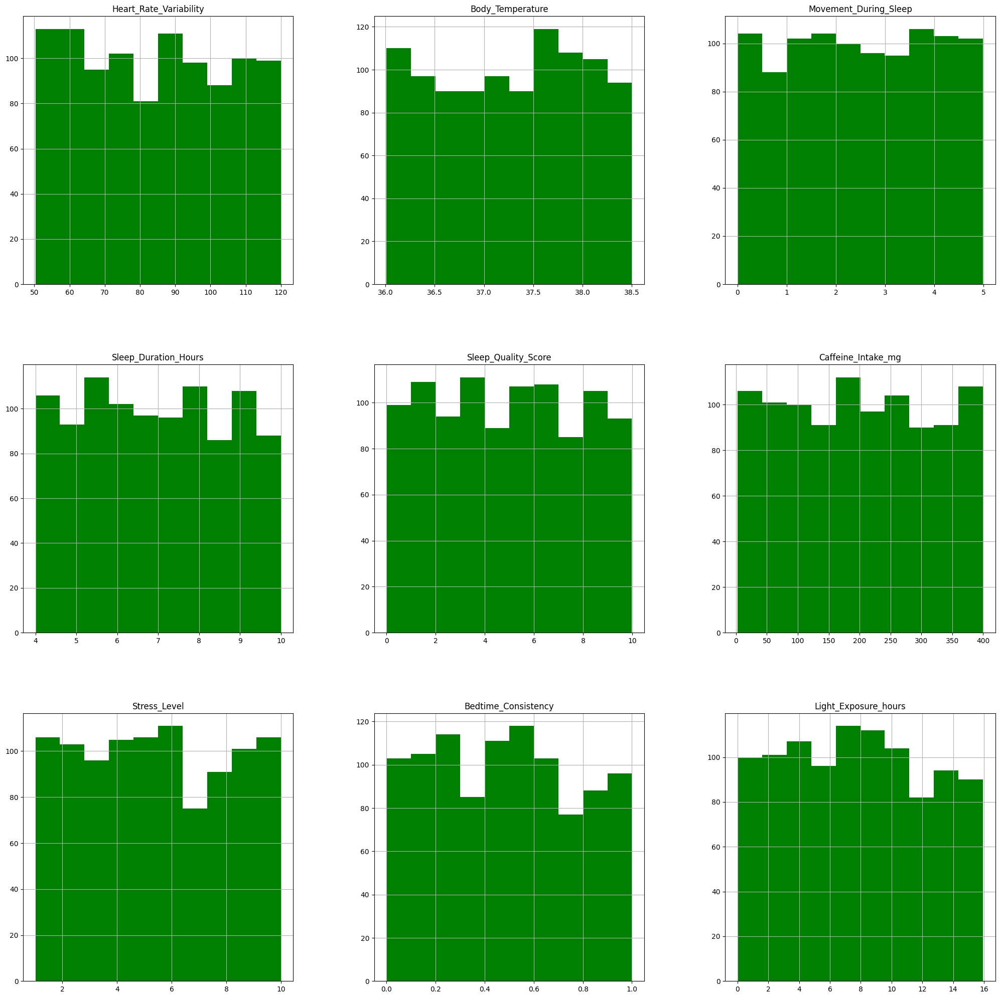

In [24]:
# plot the histgram:
data.hist(figsize=(25,25),color="g")

<Figure size 30000x30000 with 0 Axes>

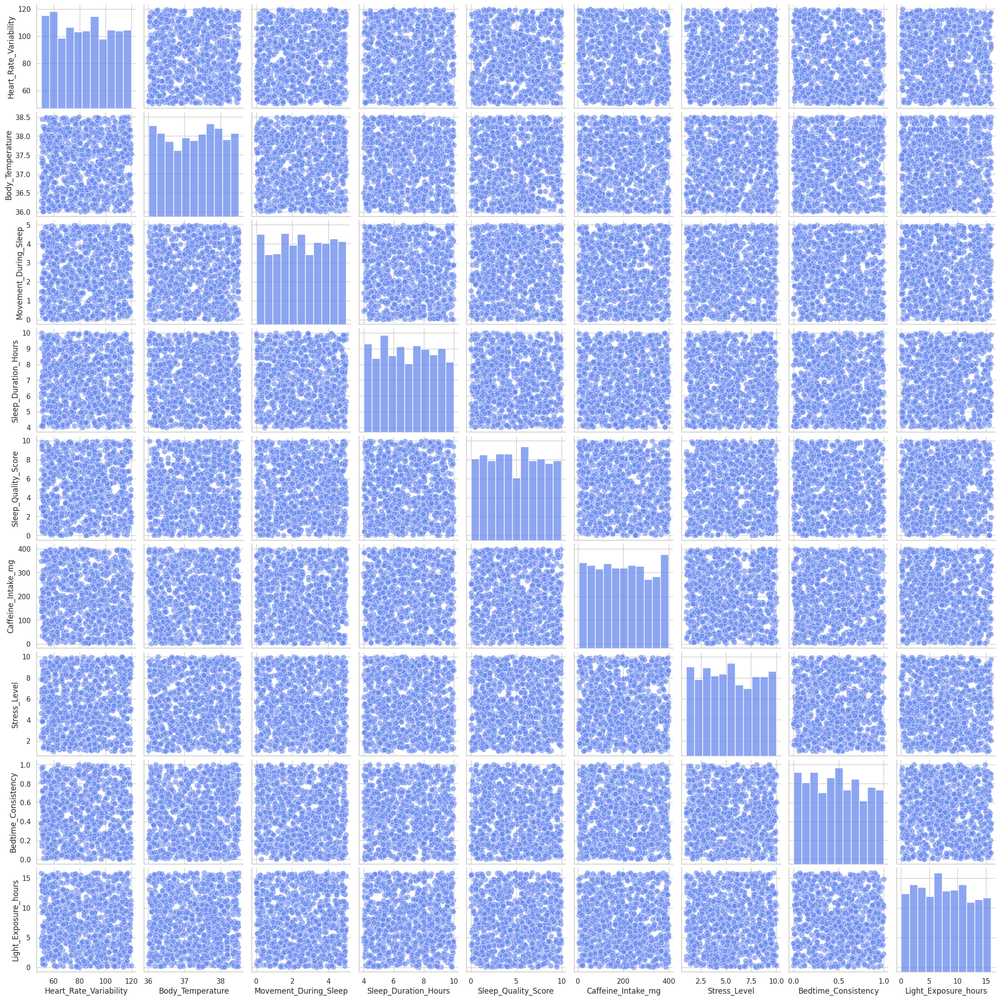

In [25]:
# observe for the float_data
plt.figure(figsize=(100, 100), dpi=300)
sns.set(style="whitegrid")  # Set the plot style
sns.set_palette("coolwarm")    # Set the color palette
sns.pairplot(data.select_dtypes(include='float64'), plot_kws={'alpha': 0.6, 's': 80})

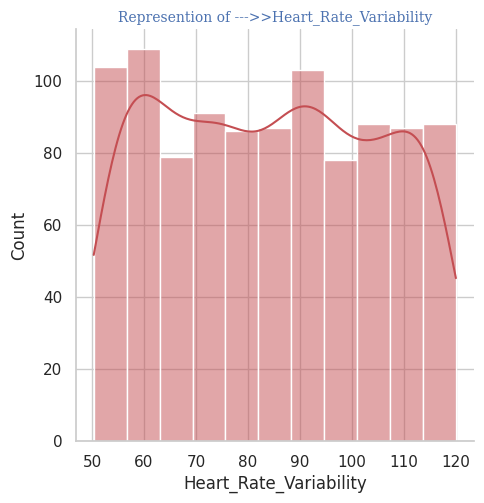

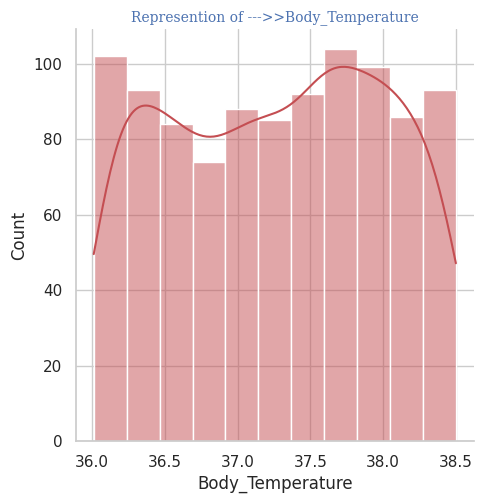

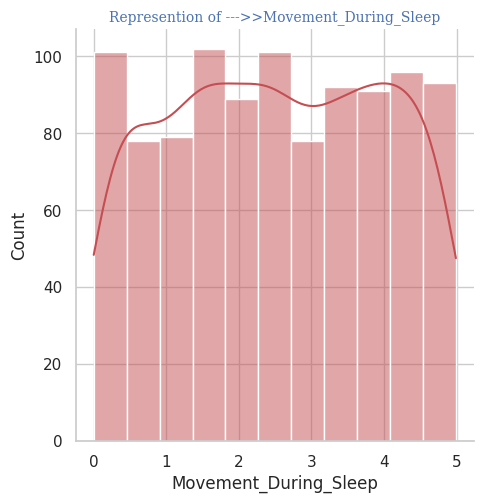

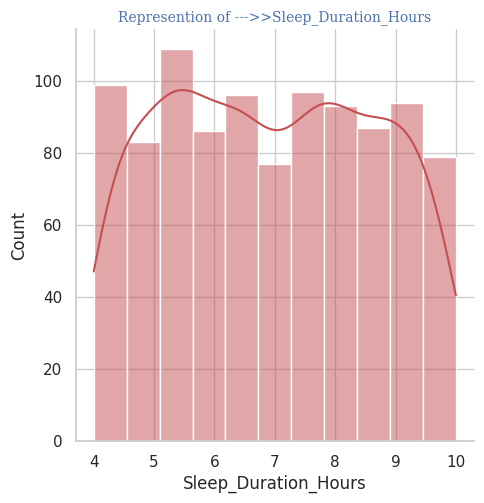

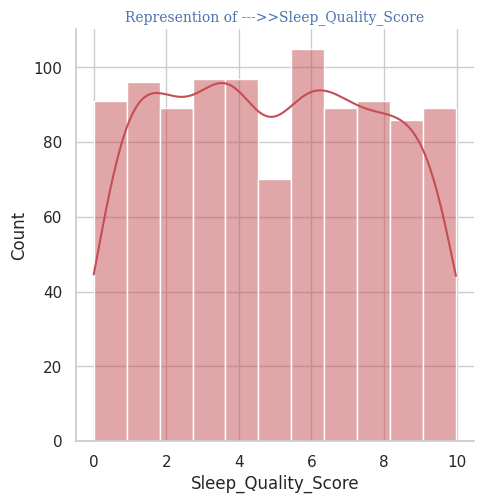

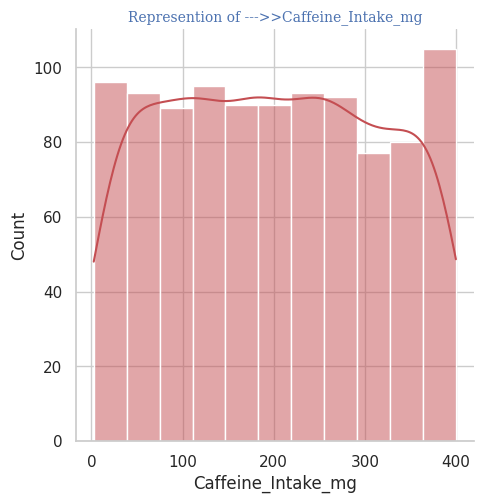

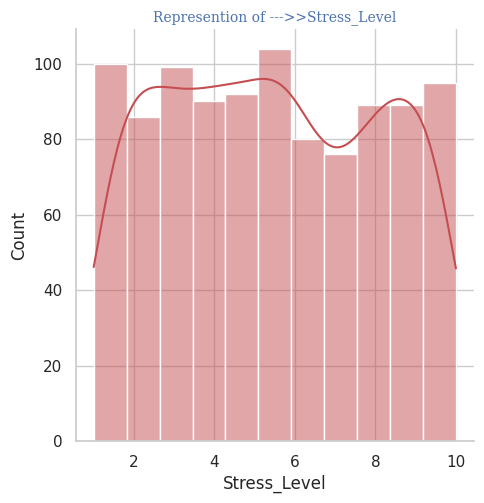

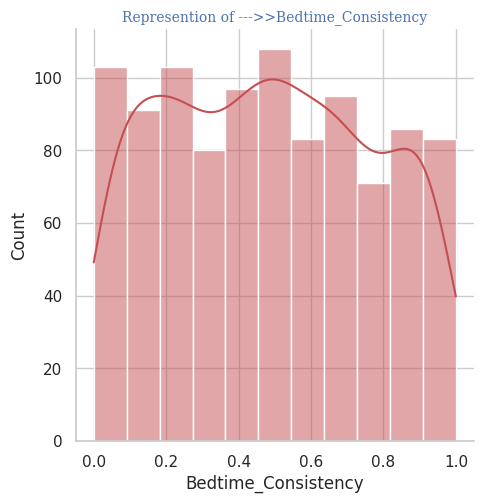

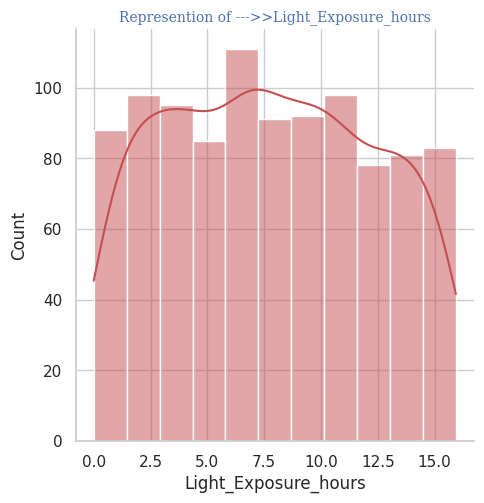

In [26]:
for col in data.select_dtypes(include="float64").columns:
    sns.displot(data[col],kde=True,color="r",label=col)
    sns.set(style="whitegrid")  # Set the plot style
    sns.set_palette("coolwarm")    # Set the color palette
    plt.title("Represention of --->>"+col,fontdict=f2)

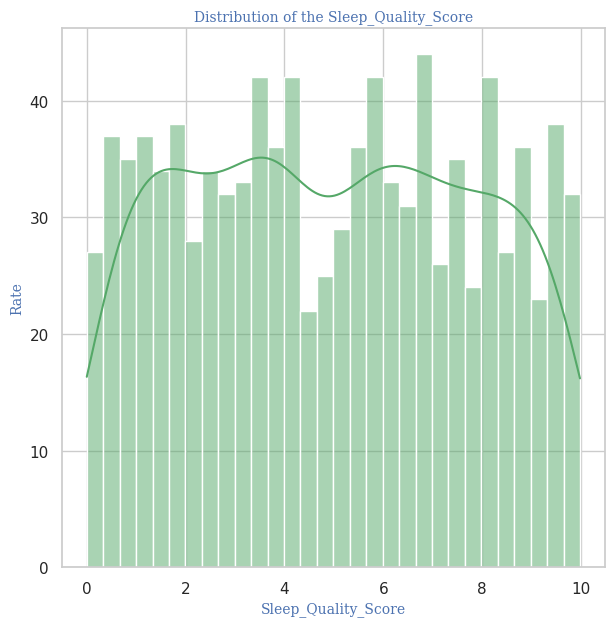

In [27]:
#observe the Sleep_Quality_Score distribution:
plt.figure(figsize=(7,7))
plt.title("Distribution of the Sleep_Quality_Score",fontdict=f2)
plt.xlabel("Sleep_Quality_Score",fontdict=f2)
plt.ylabel("Rate",fontdict=f2)
sns.histplot(data["Sleep_Quality_Score"],color="g",bins=30,kde=True,label="Sleep_Quality_Score")
plt.show()

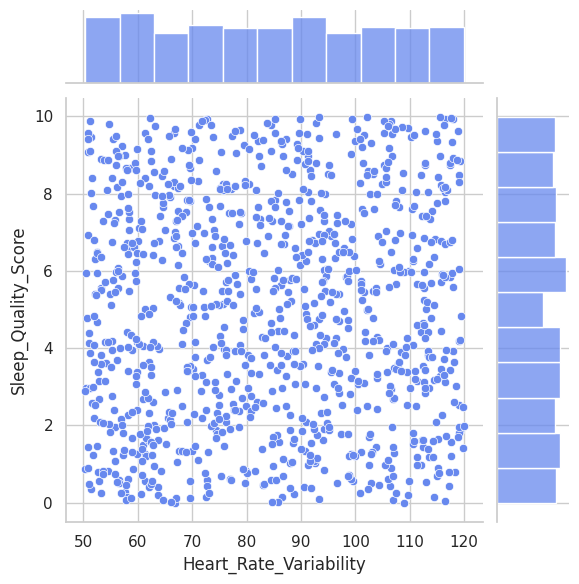

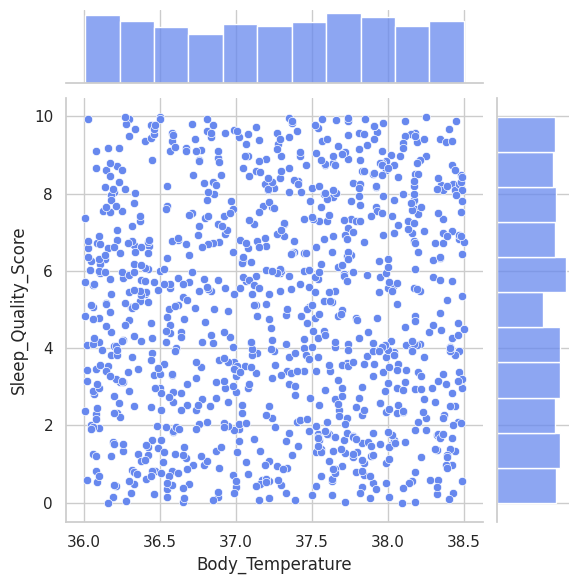

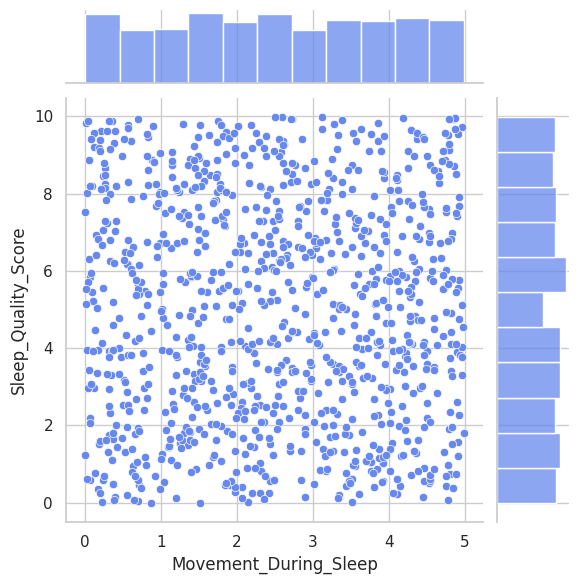

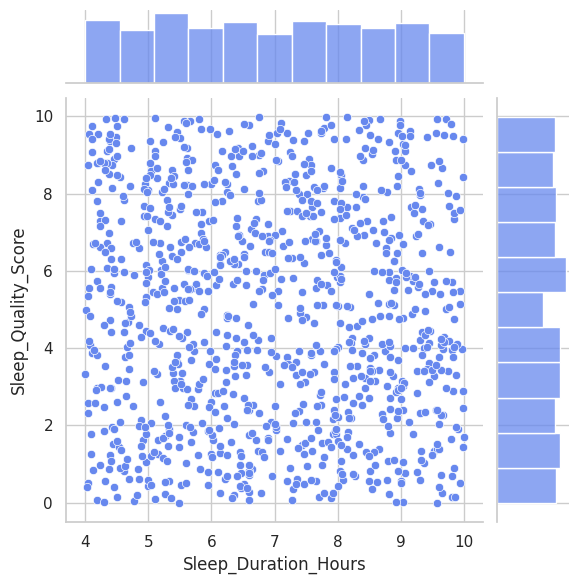

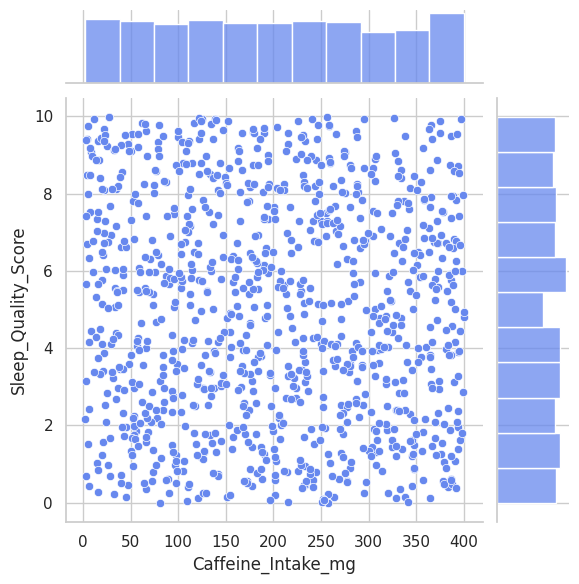

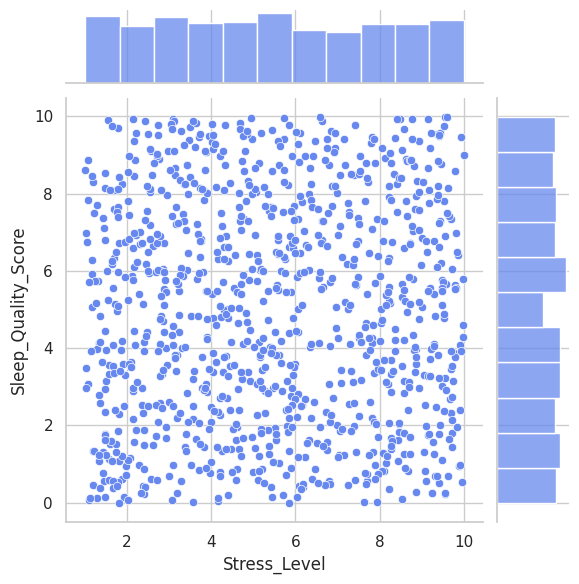

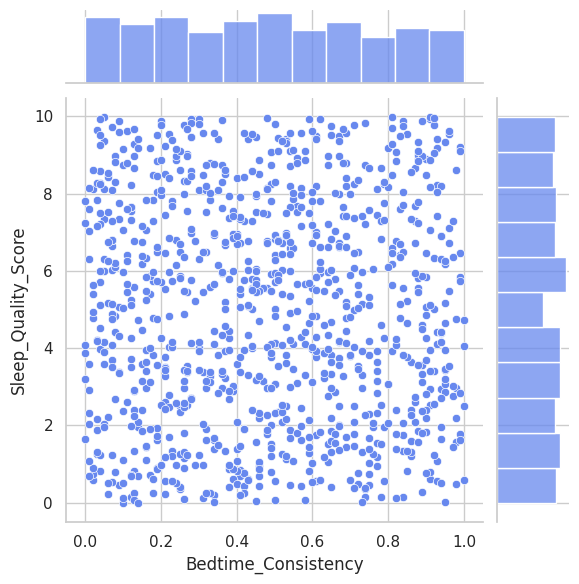

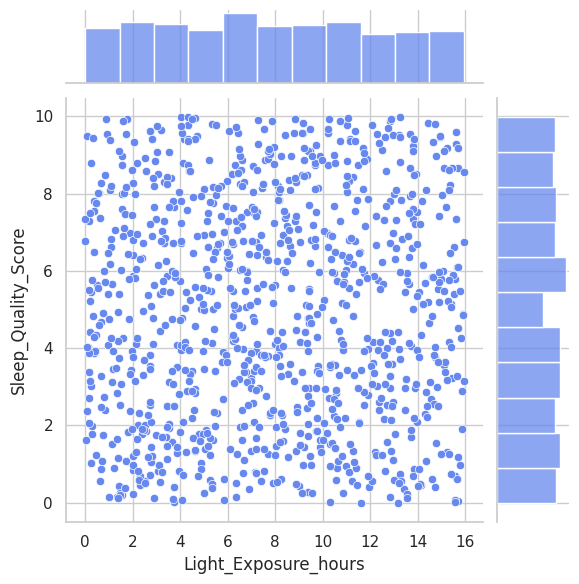

In [28]:
for col in data.select_dtypes("number"):
    if col !="Sleep_Quality_Score":
       with sns.axes_style("white"):
          sns.set(style="whitegrid")  # Set the plot style
          sns.set_palette("coolwarm")    # Set the color palette
          sns.jointplot(x=data[col],y=data["Sleep_Quality_Score"],kind="scatter")

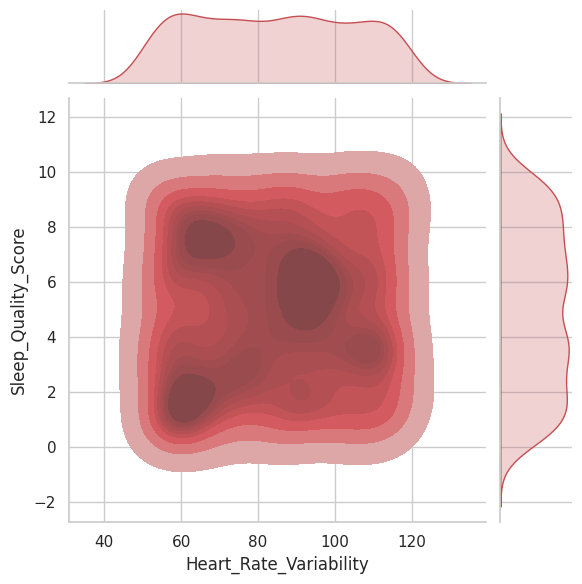

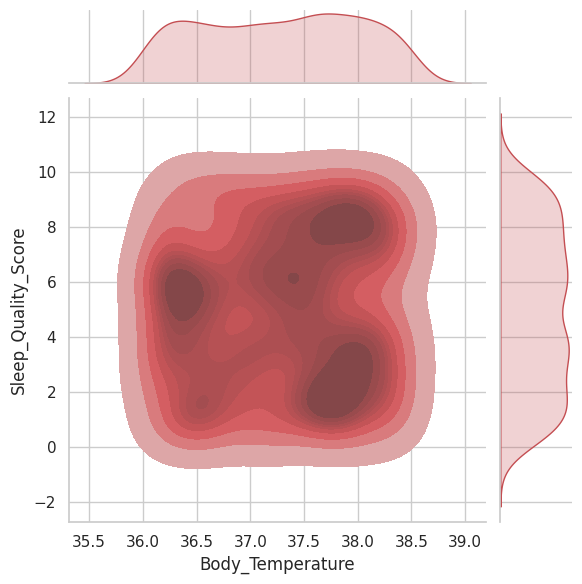

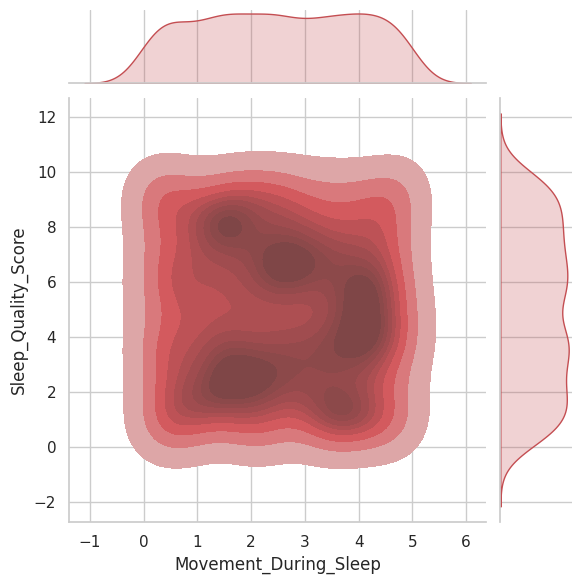

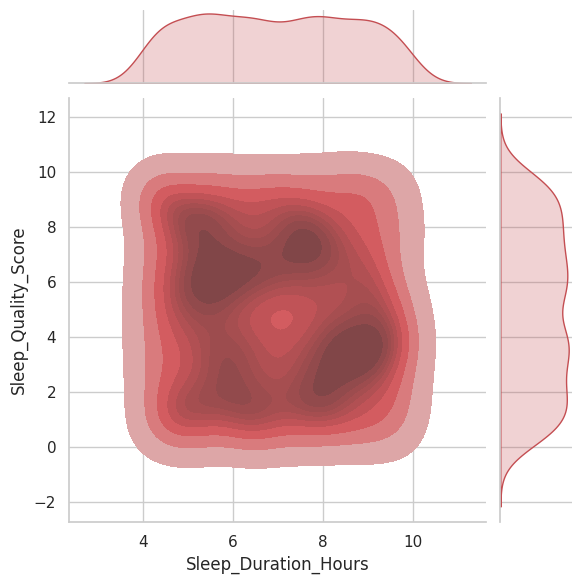

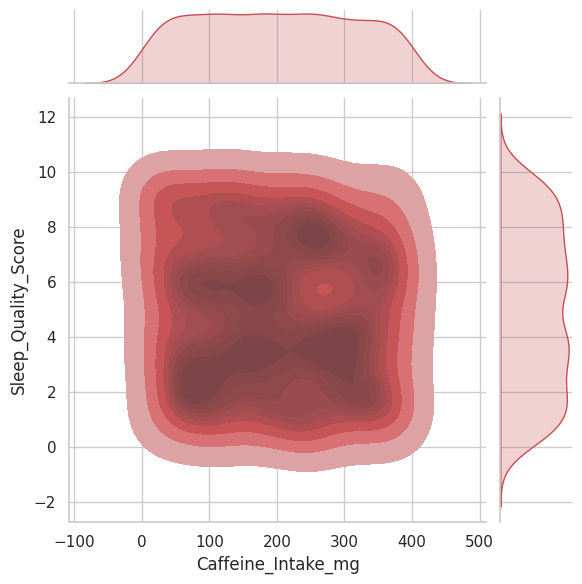

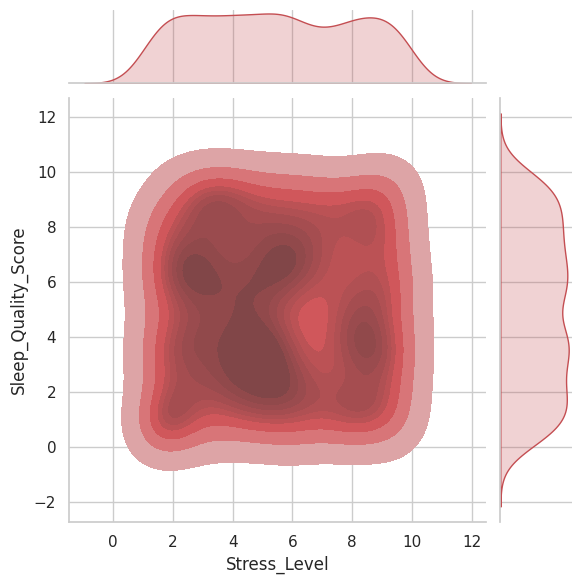

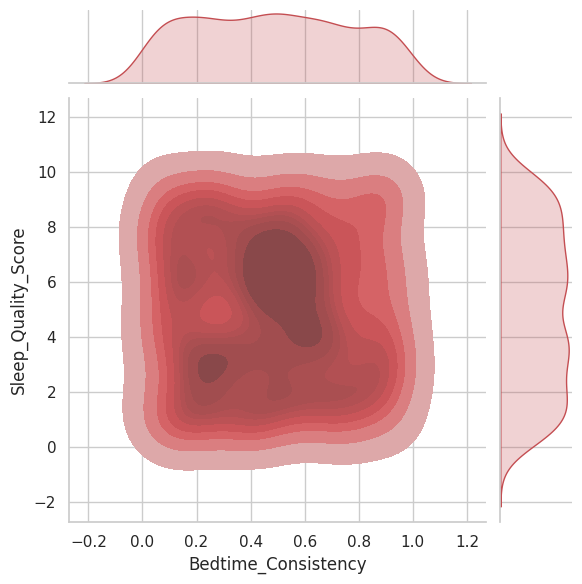

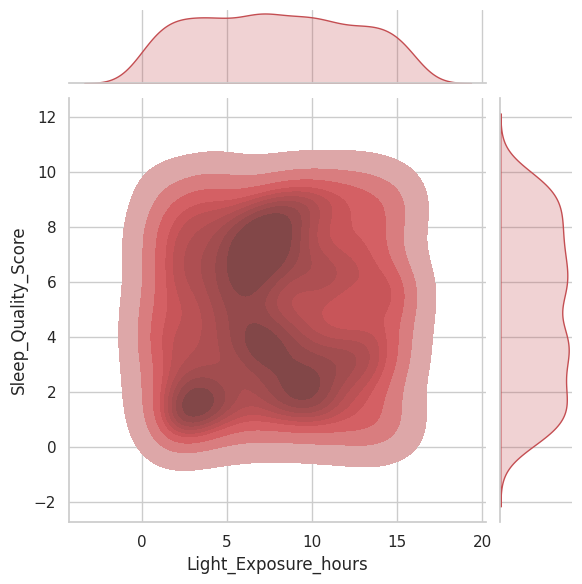

In [29]:
for col in data.select_dtypes("number"):
    if col !="Sleep_Quality_Score":
       with sns.axes_style("white"):
           sns.set(style="whitegrid")  # Set the plot style
           sns.set_palette("coolwarm")    # Set the color palette
           sns.jointplot(x=data[col],y=data["Sleep_Quality_Score"],kind="kde",fill=True,color="r")

## Data processing and Training :

In [30]:
# Convert all Categorical columns into Numerical columns :
label_encoder=LabelEncoder()
for col in data.columns:
    data[col]=label_encoder.fit_transform(data[col])
data    

,Heart_Rate_Variability,Body_Temperature,Movement_During_Sleep,Sleep_Duration_Hours,Sleep_Quality_Score,Caffeine_Intake_mg,Stress_Level,Bedtime_Consistency,Light_Exposure_hours
0,364,44,116,333,356,388,413,4,553
1,893,132,108,387,500,472,108,19,528
2,687,212,399,120,474,845,547,83,74
3,569,177,110,310,94,340,392,77,693
4,162,196,120,280,91,861,98,35,432
...,...,...,...,...,...,...,...,...,...
995,91,160,383,218,556,687,377,27,391
996,856,232,70,161,70,505,427,21,127
997,141,16,138,193,205,761,567,46,737
998,890,13,129,258,506,489,217,91,85


In [31]:
# impute the data :
for col in data.select_dtypes("number").columns:
    # Create an imputer object
    imputer = SimpleImputer(missing_values=np.nan, strategy="mean")
    # Fit and transform the column
    imputed_values = imputer.fit_transform(data[col].values.reshape(-1, 1))
    # Squeeze the array to ensure it's 1D
    data[col] = np.squeeze(imputed_values)
data

,Heart_Rate_Variability,Body_Temperature,Movement_During_Sleep,Sleep_Duration_Hours,Sleep_Quality_Score,Caffeine_Intake_mg,Stress_Level,Bedtime_Consistency,Light_Exposure_hours
0,364.0,44.0,116.0,333.0,356.0,388.0,413.0,4.0,553.0
1,893.0,132.0,108.0,387.0,500.0,472.0,108.0,19.0,528.0
2,687.0,212.0,399.0,120.0,474.0,845.0,547.0,83.0,74.0
3,569.0,177.0,110.0,310.0,94.0,340.0,392.0,77.0,693.0
4,162.0,196.0,120.0,280.0,91.0,861.0,98.0,35.0,432.0
...,...,...,...,...,...,...,...,...,...
995,91.0,160.0,383.0,218.0,556.0,687.0,377.0,27.0,391.0
996,856.0,232.0,70.0,161.0,70.0,505.0,427.0,21.0,127.0
997,141.0,16.0,138.0,193.0,205.0,761.0,567.0,46.0,737.0
998,890.0,13.0,129.0,258.0,506.0,489.0,217.0,91.0,85.0


In [32]:
# selecting numerical features :
numerical_features = data.select_dtypes(include=['number'])

# Initialize StandardScaler
scaler = StandardScaler()

# Fit and transform numerical features
scaled_numerical_features = scaler.fit_transform(numerical_features)

# Create a DataFrame from the scaled numerical features
scaled_numerical_df = pd.DataFrame(scaled_numerical_features, columns=numerical_features.columns)

scaled_numerical_df

,Heart_Rate_Variability,Body_Temperature,Movement_During_Sleep,Sleep_Duration_Hours,Sleep_Quality_Score,Caffeine_Intake_mg,Stress_Level,Bedtime_Consistency,Light_Exposure_hours
0,-0.374571,-1.111152,-0.829245,0.672504,0.267910,-0.370215,0.557888,-1.552435,0.865903
1,1.594269,0.125914,-0.892184,1.057738,1.074801,-0.077136,-1.119384,-1.025757,0.748718
2,0.827575,1.250518,1.397222,-0.847030,0.929112,1.224277,1.294789,1.221401,-1.379361
3,0.388401,0.758504,-0.876449,0.508423,-1.200183,-0.537689,0.442404,1.010730,1.522139
4,-1.126377,1.025597,-0.797775,0.294404,-1.216993,1.280102,-1.174377,-0.463968,0.298728
...,...,...,...,...,...,...,...,...,...
995,-1.390626,0.519525,1.271344,-0.147901,1.388592,0.673008,0.359915,-0.744863,0.106545
996,1.456562,1.531670,-1.191144,-0.554537,-1.334665,0.038003,0.634878,-0.955534,-1.130929
997,-1.204536,-1.504763,-0.656163,-0.326250,-0.578204,0.931197,1.404774,-0.077738,1.728384
998,1.583104,-1.546936,-0.726969,0.137457,1.108421,-0.017822,-0.519966,1.502295,-1.327799


In [33]:
# split the data into Target & the other data:

x=data.drop(columns="Sleep_Quality_Score",axis=1)
y=data["Sleep_Quality_Score"]

print(np.shape(x),np.shape(y))

(1000, 8) (1000,)


In [34]:
# train the data:

x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.3,random_state=42)
print(np.shape(x_train),np.shape(x_test))
print(np.shape(y_train),np.shape(y_test))


(700, 8) (300, 8)

(700,) (300,)


## Bulding Models :

In [35]:
# Dictionary of models

RR=Ridge()
parameters=[{'alpha':[0.001,0.1,1,10,100,1000,100000]}]
models = {
    "RandomForestRegressor": RandomForestRegressor(n_estimators=100,random_state=42,n_jobs=-1),
    "LinearRegression": LinearRegression(),
    "DecisionTreeRegressor": DecisionTreeRegressor(max_depth=4,random_state=42),
    "GridentSearchCV":GridSearchCV(RR,parameters,cv=4),
    "SVR":SVR()

}

In [36]:
for model_name, model in models.items():
    # Fit the model to the training data
    
    model.fit(x_train, y_train)
    
    # Make predictions on the test data
    
    y_pred = model.predict(x_test)
    
    # Evaluate the model
    
    mse = metrics.mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
   

    # Print the evaluation metrics for each model
    
    print(f"Model: {model_name}")
    print(f"Mean Squared Error (MSE): {mse}")
    print(f"Root Error:{rmse}")
    print("-"*50)

Model: RandomForestRegressor

Mean Squared Error (MSE): 32196.63567833333

Root Error:179.43420988856425

--------------------------------------------------

Model: LinearRegression

Mean Squared Error (MSE): 32130.66275558751

Root Error:179.2502796527456

--------------------------------------------------

Model: DecisionTreeRegressor

Mean Squared Error (MSE): 31898.88327788132

Root Error:178.6025847458018

--------------------------------------------------

Model: GridentSearchCV

Mean Squared Error (MSE): 32018.540983513303

Root Error:178.93725431981264

--------------------------------------------------

Model: SVR

Mean Squared Error (MSE): 31216.138733599222

Root Error:176.68089521393992

--------------------------------------------------


In [37]:
# Explain the prediction for DecisionTree_model :
DT=models["DecisionTreeRegressor"]
tree_representation = tree.export_text(DT)
print(tree_representation)

|--- feature_4 <= 89.50

|   |--- feature_2 <= 360.00

|   |   |--- feature_3 <= 15.50

|   |   |   |--- feature_4 <= 44.00

|   |   |   |   |--- value: [50.00]

|   |   |   |--- feature_4 >  44.00

|   |   |   |   |--- value: [312.50]

|   |   |--- feature_3 >  15.50

|   |   |   |--- feature_6 <= 79.50

|   |   |   |   |--- value: [448.00]

|   |   |   |--- feature_6 >  79.50

|   |   |   |   |--- value: [310.00]

|   |--- feature_2 >  360.00

|   |   |--- feature_5 <= 591.00

|   |   |   |--- feature_6 <= 76.00

|   |   |   |   |--- value: [343.46]

|   |   |   |--- feature_6 >  76.00

|   |   |   |   |--- value: [195.25]

|   |   |--- feature_5 >  591.00

|   |   |   |--- feature_5 <= 597.00

|   |   |   |   |--- value: [12.00]

|   |   |   |--- feature_5 >  597.00

|   |   |   |   |--- value: [41.00]

|--- feature_4 >  89.50

|   |--- feature_5 <= 101.00

|   |   |--- feature_3 <= 448.00

|   |   |   |--- feature_2 <= 416.50

|   |   |   |   |--- value: [263.78]

|   |   |   |--- 

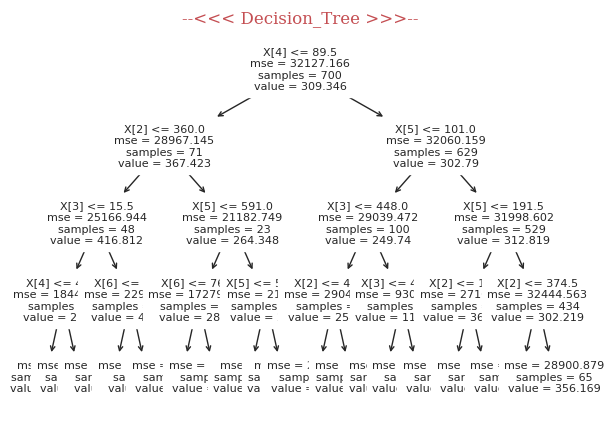

In [38]:
#plot the tree :

# if i want to plot tree:

f={"color":"r","family":"serif","size":12}
plt.figure(figsize=(7,5),dpi=100) 
tree.plot_tree(DT,fontsize=8,)
plt.title("--<<< Decision_Tree >>>--",fontdict=f)
plt.show()

## Save & load the best model :

In [39]:
# save and load Decisiontree Model :

# Save the model :

from joblib import dump, load

# Save the model
dump(DT, 'DT.joblib')

# Load the model
model = load('DT.joblib')

## Conclusion :














<div style="border: 2px solid red; padding: 10px; background-color: #F5F5F5; color: black; border-radius: 30px 45px 30px 45px;">


    

<p>&bull; Thank you for reading this notebook! If you found this content useful, please consider giving it an upvote.</p>




<p>&bull; Your support is greatly appreciated! .</p>




<p>&bull; Kaggle: Your Home for Data Science</p>




<p>&bull; <a href="https://www.kaggle.com/abdalrhamnhebishy" target="_blank">Kaggle profile</a>.</p>



<p>&bull;  AbdalRhman Hebishy , DataScientist & Machine learning  Specialist .</p>
   

</div>


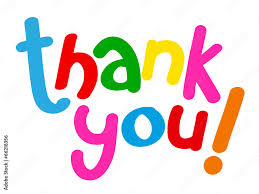